# Simulating a Double Pendulum Using the Lagrangian Method

Defines a DoublePendulum class that is used to generate basic plots from solving Lagrange's equations

In [1]:
%matplotlib inline

# Import necessary functions
import numpy as np
from scipy.integrate import solve_ivp
import matplotlib.pyplot as plt
from IPython.display import Image

We will define our coordinate conventions based on this figure from the Wikipedia article on the double pendulum.
https://en.wikipedia.org/wiki/Double_pendulum

In [2]:
Image(url='https://upload.wikimedia.org/wikipedia/commons/thumb/7/78/Double-Pendulum.svg/340px-Double-Pendulum.svg.png')

For the Lagrangian method, we will choose to describe the system using the generalized coordinates $\theta_1$ and $\theta_2$, the angle of each pendulum from the vertical axis. This choice of generalized coordinates establishes a natural relationship to the cartesian coordinates $x$ and $y$. Namely,

$\begin{align}
   & x_1 = L_1 \sin\theta_1 && x_2 = x_1 + L_2 \sin\theta_2 \\
   & y_1 = L_1 \cos\theta_1 && y_2 = y_1 + L_2 \cos\theta_2
\end{align}$

where the cartesian origin is set at the top of the first pendulum $L_1$. Thus, $y$ is measured vertically downward from the origin, and $x$ is measured horizontally to the right of the origin. It is useful to write the energies in terms of cartesian coordinates $x$ and $y$ first, then use these relationships to write the Lagranian in terms of $\theta_1$ and $\theta_2$. To write the energies, we need to calculate $\dot{x_i}$ and $\dot{y_i}$:

$\begin{align}
   & \dot{x_1} = L_1 \dot{\theta_1} \cos\theta_1 && \dot{x_2} = L_1 \dot{\theta_1} \cos\theta_1 + L_2 \dot{\theta_2} \cos\theta_2 \\
   & \dot{y_1} = -L_1 \dot{\theta_1} \sin\theta_1 && \dot{y_2} = -L_1 \dot{\theta_1} \sin\theta_1 - L_2 \dot{\theta_2} \sin\theta_2
\end{align}$

Setting the line of zero potential horizontally through the cartesian origin, the kinetic and potential energies are:

$\begin{align}
T &= \frac{1}{2}m_1 v_{1}^{2} + \frac{1}{2}m_2 v_{2}^{2} = \frac{1}{2} m_1 \left( \dot{x}_{1}^{2} +  \dot{y}_{1}^{2}\right) + \frac{1}{2} m_2 \left( \dot{x}_{2}^{2} +  \dot{y}_{2}^{2}\right) \\
  &= \frac{1}{2} m_1 \left( L_1^{2} \dot{\theta}_1^{2} \cos^{2}\theta_1 +  L_1^{2} \dot{\theta}_1^{2} \sin^{2}\theta_1\right) + \frac{1}{2} m_2 \left( \left(L_1 \dot{\theta_1} \cos\theta_1 + L_2 \dot{\theta_2} \cos\theta_2\right)^{2} +  \left(-L_1 \dot{\theta_1} \sin\theta_1 - L_2 \dot{\theta_2} \sin\theta_2\right)^{2}\right) \\
  &=\frac{1}{2} m_1 L_1^2 \dot{\theta}_1^2 + \frac{1}{2} m_2 \left( L_1^2 \dot{\theta}_1^2 + L_2^2 \dot{\theta}_2^2 + 2L_1 L_2 \cos{\left(\theta_1 - \theta_2\right)} \dot{\theta_1} \dot{\theta_2} \right) \\
U &= -m_1 g y_1 - m_2 g y_2 = -\left( m_1 + m_2 \right) L_1 g \cos\theta_1 - m_2 L_2 g \cos\theta_2
\end{align}$
  
The Lagrangian, $\mathcal{L}=T-U$, is:

$\begin{align}
\mathcal{L} = \frac{1}{2}\left( m_1 + m_2 \right) L_1^2 \dot{\theta}_1^2 + \frac{1}{2} m_2 L_2^2 \dot{\theta}_2^2 + m_2 L_1 L_2 \dot{\theta_1} \dot{\theta_2} \cos\left(\theta_1 - \theta_2\right) + \left(m_1 + m_2\right) L_1 g \cos\theta_1 + m_2 g L_2 \cos\theta_2
\end{align}$

The Euler-Lagrange equations are:

$\begin{align}
    \frac{d}{dt} \left( \frac{\partial \mathcal{L}}{\partial \dot{q_i}} \right) - \frac{\partial \mathcal{L}}{\partial q_i} = 0 ~~ \text{for the generalized coordinates} ~~ q_i = \theta_1, \theta_2
\end{align}$

Plugging in the Lagrangian we found above, we get the following equations:
$\begin{align}
   \theta_1 ~ \text{eq'n:} \quad & \left( m_1 + m_2 \right) L_1 \ddot{\theta_1} + m_2 L_2 \ddot{\theta_2} \cos\left(\theta_1 - \theta_2 \right) + m_2 L_2 \dot{\theta}_2^2 \sin\left( \theta_1 - \theta_2 \right) + \left(m_1 + m_2\right) g \sin\theta_1 = 0\\
    \theta_2 ~ \text{eq'n:} \quad & m_2 L_2 \ddot{\theta_2} + m_2 L_1 \ddot{\theta_1} \cos\left( \theta_1 - \theta_2 \right) - m_2 L_1 \dot{\theta}_1^2 \sin\left(\theta_1 - \theta_2\right) + m_2 g \sin\theta_2 = 0
\end{align}$

Solving for $\ddot{\theta_1}$ and $\ddot{\theta_2}$ we obtain the following:

$\begin{align}
    \ddot{\theta_1} &= \frac{m_2 g \sin\theta_2 \cos\left(\theta_1-\theta_2\right) - m_2 \sin\left(\theta_1-\theta_2\right)\left(L_1 \dot{\theta}_1^2 \cos\left(\theta_1 - \theta_2\right) + L_2 \dot{\theta}_2^2\right) - \left(m_1 + m_2\right) g \sin\theta_1}{L_1\left(m_1 + m_2 \sin^2\left(\theta_1 -\theta_2\right)\right)} \\
    \ddot{\theta_2} &= \frac{\left(m_1+m_2\right) \left( L_1 \dot{\theta}_1^2 \sin\left(\theta_1-\theta_2\right) - g\sin\theta_2 + g\sin\theta_1 \cos\left(\theta_1-\theta_2\right)\right) + m_2 L_2 \dot{\theta}_2^2 \sin\left(\theta_1 - \theta_2\right) \cos\left(\theta_1 - \theta_2\right)}{L_2 \left(m_1 + m_2 \sin^2\left(\theta_1 -\theta_2\right)\right)}
\end{align}$

The function that we will use to solve these equations, solve_ivp, must have first order differential equations as an input. Since the above equations are second order in $\theta_1$ and $\theta_2$, we must perform a change of variables to obtain a first order system. Define the variables $z_1 \equiv \dot{\theta_1}$ and $z_2 \equiv \dot{\theta_2}$, then we have the following system of first (and zeroth) order differential equations:

$\begin{align}
    z_1 &= \dot{\theta_1} \\
    z_2 &= \dot{\theta_2} \\
    \dot{z}_1 &= \frac{m_2 g \sin\theta_2 \cos\left(\theta_1-\theta_2\right) - m_2 \sin\left(\theta_1-\theta_2\right)\left(L_1 z_1^2 \cos\left(\theta_1 - \theta_2\right) + L_2 z_2^2\right) - \left(m_1 + m_2\right) g \sin\theta_1}{L_1\left(m_1 + m_2 \sin^2\left(\theta_1 -\theta_2\right)\right)} \\
    \dot{z}_2 &= \frac{\left(m_1+m_2\right) \left( L_1 z_1^2 \sin\left(\theta_1-\theta_2\right) - g\sin\theta_2 + g\sin\theta_1 \cos\left(\theta_1-\theta_2\right)\right) + m_2 L_2 z_2^2 \sin\left(\theta_1 - \theta_2\right) \cos\left(\theta_1 - \theta_2\right)}{L_2 \left(m_1 + m_2 \sin^2\left(\theta_1 -\theta_2\right)\right)}
\end{align}$

These equations will be implemented into the double pendulum solver class.

In [3]:
class DoublePendulum():
    """
    DoublePendulum class implements the parameters and Lagrange's equations for 
    a simple double pendulum (no driving or damping).
    
    Parameters
    ----------
    L1 : float
         length of the first pendulum
    L2 : float
         length of the second pendulum
    m1 : float
         mass of the first pendulum bob
    m2 : float
         mass of the second pendulum bob
    g : float
        gravitational acceleration at sea level
        
    Methods
    -------
    dy_dt(t, y)
        Returns the right side of the differential equation in vector y,
        given time t and the corresponding value of y.
    """
    def __init__(self, L1=1., L2=1., m1=1., m2=1., g=1.
                ):
        # Initialize parameters to use within class functions
        self.L1 = L1
        self.L2 = L2
        self.m1 = m1
        self.m2 = m2
        self.g = g
        
    def dy_dt(self, t, y):
        """
        This function returns the right-hand side of the diffeq:
        [dtheta1/dt dtheta2/dt d^2theta1/dt^2 d^2theta2/dt^2]
        
        Parameters
        ----------
        t : float
            time
        y : float
            A 4-component vector with y[0] = theta1(t), y[1] = theta2(t)
            y[2] = theta1_dot(t), and y[3] = theta2_dot(t)
        
        Returns
        -------
        """
        
        # Define variables from input vector y
        theta1 = y[0]
        theta2 = y[1]
        theta1_dot = y[2]
        theta2_dot = y[3]
        
        # Define recurring terms for simplicity
        mt = self.m1 + self.m2
        c = np.cos(theta1 - theta2)
        s = np.sin(theta1 - theta2)
        div = self.m1 + self.m2 * (s**2)
        
        # Define system of equations (written above)
        z1 = theta1_dot
        z2 = theta2_dot
        z1_dot = (self.m2 * self.g * np.sin(theta2) * c - self.m2 * s * (self.L1 * z1**2 * c + self.L2 * z2**2) \
                    - mt * self.g * np.sin(theta1)) / (self.L1 * div)
        z2_dot = (mt * (self.L1 * z1**2 * s - self.g * np.sin(theta2) + self.g * np.sin(theta1) * c) \
                    + self.m2 * self.L2 * z2**2 * s * c) / (self.L2 * div)
        
        return z1, z2, z1_dot, z2_dot
    
    def solve_ode(self, t_pts, theta1_0, theta2_0, theta1_dot_0, theta2_dot_0, 
                  abserr=1.0e-10, relerr=1.0e-10):
        """
        Solve the ODE given initial conditions.
        Specify smaller abserr and relerr for more precision.
        """
        # Solve the system using the solve_ivp method
        y = [theta1_0, theta2_0, theta1_dot_0, theta2_dot_0]
        solution = solve_ivp(self.dy_dt, (t_pts[0], t_pts[-1]),
                            y, t_eval=t_pts,
                            atol=abserr, rtol=relerr)
        
        # Extract solutions
        theta1, theta2, theta1_dot, theta2_dot = solution.y
        
        return theta1, theta2, theta1_dot, theta2_dot


We will use the plotting functions $\textbf{plot_y_vs_x}$ and $\textbf{start_stop_indices}$ that were provided to us for previous assignments.

In [4]:
def plot_y_vs_x(x, y, axis_labels=None, label=None, title=None, 
                color=None, linestyle=None, semilogy=False, loglog=False,
                ax=None):
    """
    Generic plotting function: return a figure axis with a plot of y vs. x,
    with line color and style, title, axis labels, and line label
    """
    if ax is None:        # if the axis object doesn't exist, make one
        ax = plt.gca()

    if (semilogy):
        line, = ax.semilogy(x, y, label=label, 
                            color=color, linestyle=linestyle)
    elif (loglog):
        line, = ax.loglog(x, y, label=label, 
                          color=color, linestyle=linestyle)
    else:
        line, = ax.plot(x, y, label=label, 
                    color=color, linestyle=linestyle)

    if label is not None:    # if a label if passed, show the legend
        ax.legend()
    if title is not None:    # set a title if one if passed
        ax.set_title(title)
    if axis_labels is not None:  # set x-axis and y-axis labels if passed  
        ax.set_xlabel(axis_labels[0])
        ax.set_ylabel(axis_labels[1])

    return ax, line

In [5]:
def start_stop_indices(t_pts, plot_start, plot_stop):
    start_index = (np.fabs(t_pts-plot_start)).argmin()  # index in t_pts array 
    stop_index = (np.fabs(t_pts-plot_stop)).argmin()  # index in t_pts array 
    return start_index, stop_index

# Make simple double pendulum plots

Firstly, we define our starting and stopping times for plotting. We also introduce the parameters necessary to fully specify the double pendulum.

In [6]:
# Labels for individual plot axes
theta_vs_time_labels = (r'$t$', r'$\theta(t)$')
theta_dot_vs_time_labels = (r'$t$', r'$d\theta/dt(t)$')
state_space_labels = (r'$\theta$', r'$d\theta/dt$')

# Common plotting time
t_start = 0.
t_end = 200.
delta_t = 0.05

# Create array of time steps
t_pts = np.arange(t_start, t_end+delta_t, delta_t)  

# Define double pendulum parameters
L1 = 2.
L2 = 1.
m1 = 1.
m2 = 1.
g = 1.

# Initialize the double pendulum using the class
dp1 = DoublePendulum(L1=L1, L2=L2, m1=m1, m2=m2, g=g)

Plot the double pendulum for one set of initial conditions

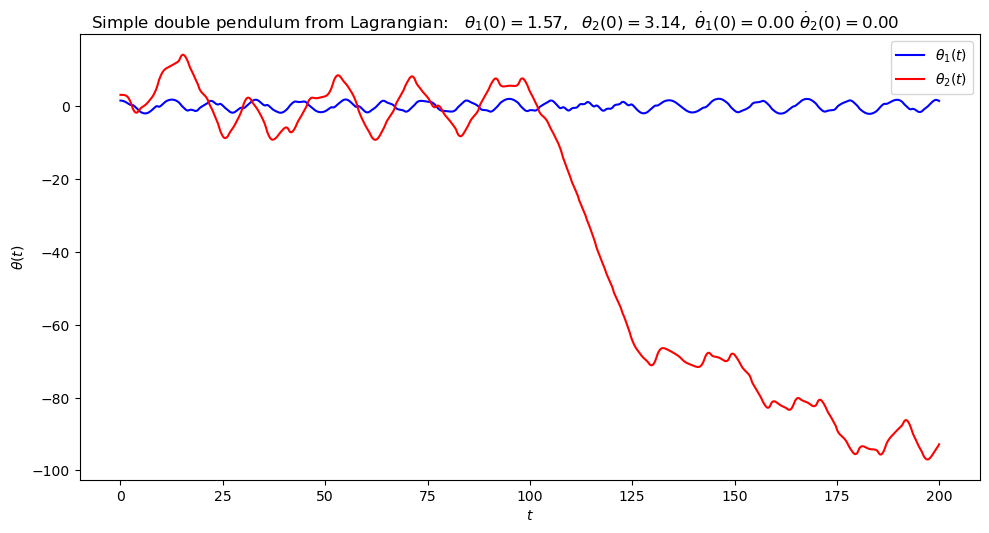

In [7]:
# Initial conditions
theta1_0 = np.pi/2
theta1_dot_0 = 0.
theta2_0 = np.pi
theta2_dot_0 = 0.
theta1, theta2, theta1_dot, theta2_dot = dp1.solve_ode(t_pts, theta1_0, theta2_0, theta1_dot_0, theta2_dot_0)

# Create figure and add text
fig = plt.figure(figsize=(10,5))
overall_title = 'Simple double pendulum from Lagrangian:  ' + \
                rf' $\theta_1(0) = {theta1_0:.2f},$' + \
                rf'  $\theta_2(0) = {theta2_0:.2f},$' + \
                rf' $\dot\theta_1(0) = {theta1_dot_0:.2f}$' + \
                rf' $\dot\theta_2(0) = {theta2_dot_0:.2f}$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# Create axes
ax_a = fig.add_subplot(1,1,1)                  

start, stop = start_stop_indices(t_pts, t_start, t_end)    
plot_y_vs_x(t_pts[start : stop], theta1[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='blue',
            label=r'$\theta_1(t)$', 
            ax=ax_a)     
plot_y_vs_x(t_pts[start : stop], theta2[start : stop], 
            axis_labels=theta_vs_time_labels, 
            color='red',
            label=r'$\theta_2(t)$', 
            ax=ax_a)    

# Adjust layout and save figure
fig.tight_layout(rect=[0, 0, 1, 1.15])
fig.savefig('double_pendulum_1.png', bbox_inches='tight')

Now create two initial conditions which deviate from each other only slightly. Plotting $|\Delta\theta|$ on a log scale will allow us to determine if the motion is chaotic.

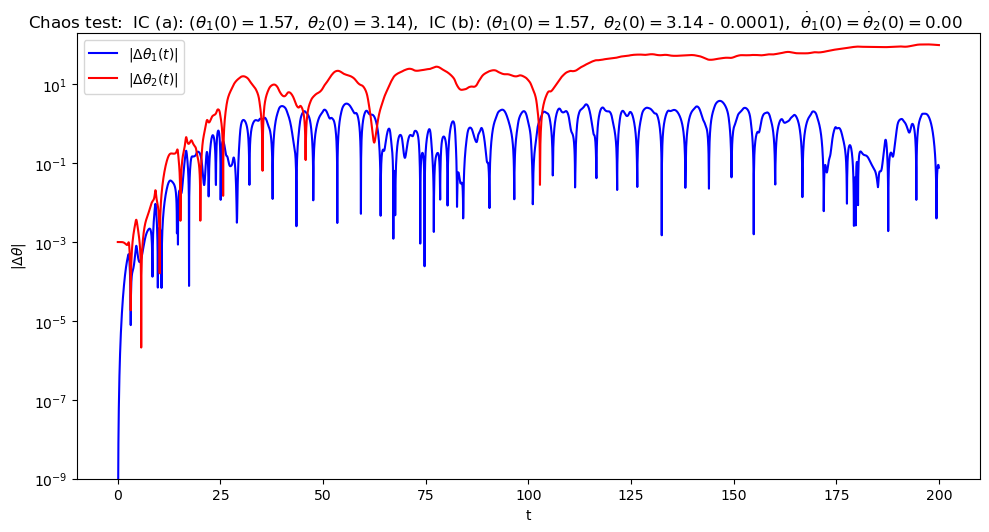

In [8]:
# Create two sets of initial conditions with slight deviation
theta1a_0 = np.pi/2
theta1a_dot_0 = 0.
theta2a_0 = np.pi
theta2a_dot_0 = 0.
theta1a, theta2a, theta1a_dot, theta2a_dot = dp1.solve_ode(t_pts, theta1a_0, theta2a_0, theta1a_dot_0, theta2a_dot_0)

theta1b_0 = np.pi/2
theta1b_dot_0 = 0.
theta2b_0 = np.pi - 0.001
theta2b_dot_0 = 0.
theta1b, theta2b, theta1b_dot, theta2b_dot = dp1.solve_ode(t_pts, theta1b_0, theta2b_0, theta1b_dot_0, theta2b_dot_0)

# Define difference between pendulums to test for chaos
Delta_theta1 = np.fabs(theta1a - theta1b)
Delta_theta2 =np.fabs(theta2a - theta2b)

# Create figure and add text
fig = plt.figure(figsize=(10,5))
overall_title = 'Chaos test:  ' + \
                'IC (a): ' + \
                '(' + \
                rf'$\theta_1(0) = {theta1a_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2a_0:.2f}$' + \
                '),  ' + \
                'IC (b): ' + \
                '(' + \
                rf'$\theta_1(0) = {theta1b_0:.2f},$' + \
                rf' $\theta_2(0) = {theta2b_0:.2f}$' + \
                ' - 0.0001' + \
                '), ' + \
                rf' $\dot\theta_1(0) = \dot\theta_2(0)= {theta1_dot_0:.2f}$' + \
                '\n'     # \n means a new line (adds some space here)
fig.suptitle(overall_title, va='baseline')
    
# Create axes
ax_a = fig.add_subplot(1,1,1)                  

# Plot with two methods just for fun
start, stop = start_stop_indices(t_pts, t_start, t_end)    
ax_a.semilogy(t_pts[start : stop], Delta_theta1[start : stop], 
            color='blue', label=r'$|\Delta\theta_1(t)|$')
plot_y_vs_x(t_pts[start : stop], Delta_theta2[start : stop], 
            color='red', semilogy=True,
            label=r'$|\Delta\theta_2(t)|$')    
ax_a.set_xlabel('t')
ax_a.set_ylabel(r'$|\Delta\theta|$')
ax_a.set_ylim([10e-10, 2*10e1])

# Adjust layout and save figure
fig.tight_layout(rect=[0, 0, 1, 1.15])
fig.savefig('double_pendulum_2.png', bbox_inches='tight')

For the conditions specified here, we can clearly see that the motion is chaotic

In [9]:
# Import animation functions
from matplotlib import animation, rc
from IPython.display import HTML

In [10]:
# Define a new time array to see long term motion of double pendulum
# t_min = 0.
# t_max = 200.
# delta_t = 0.05
# t_pts = np.arange(t_min, t_max + delta_t, delta_t)

In [11]:
def convert_xy(x0, y0, theta, L):
    # Convert pendulum angle to bob position with respect to some Cartesian origin (x0,y0)
    x = x0 + L * np.sin(theta)
    y = y0 - L * np.cos(theta)
    return x, y

We use the cell “magic” %%capture to keep the figure from being shown here. If we didn’t the animated version below would be blank.

In [12]:
%%capture

# Define size of the animation window
x_min = -3.
x_max = 3.
y_min = -3.
y_max = 3.

fig_anim = plt.figure(figsize=(5,5), num='Double Pendulum')
ax_anim = fig_anim.add_subplot(1,1,1)
ax_anim.set_xlim(x_min, x_max)
ax_anim.set_ylim(y_min, y_max)

# This next section of code initializes the data for the various objects that we will animate
# Objects include: the origin, each pendulum bob, the line connecting each pendulum bob

# Define the Cartesian origin (top of first pendulum)
x0, y0 = 0., 0.
origin_anim, = ax_anim.plot(x0, y0, 'o', markersize=6, color='black')

# Convert theta1a to (x1a, y1a) at the location of the first bob on first pendulum
x1a, y1a = convert_xy(x0, y0, theta1a[0], dp1.L1)
# Define size, shape, and color of pendulum bob
bob1a_anim, = ax_anim.plot(x1a, y1a, 'o', markersize=15, color='blue')
# Create a line connecting the origin to the first bob
line1a_anim, = ax_anim.plot([x0, x1a], [y0, y1a], color='blue', lw=3)

# Convert theta2a to (x2a, y2a) at the location of the second bob on first pendulum
x2a, y2a = convert_xy(x1a, y1a, theta2a[0], dp1.L2)
bob2a_anim, = ax_anim.plot(x2a, y2a, 'o', markersize=15, color='blue')
# Create a line connecting the first bob to the second bob
line2a_anim, = ax_anim.plot([x1a, x2a], [y1a, y2a], color='blue', lw=3)

# Convert theta1b to (x1b, y1b) at the location of the first bob on second pendulum
x1b, y1b = convert_xy(x0, y0, theta1b[0], dp1.L1)
bob1b_anim, = ax_anim.plot(x1b, y1b, 'o', markersize=15, color='red')
# Create a line connecting the origin to the first bob
line1b_anim, = ax_anim.plot([x0, x1b], [y0, y1b], color='red', lw=3)

# Convert theta2b to (x2b, y2b) at the location of the second bob on second pendulum
x2b, y2b = convert_xy(x1b, y1b, theta2b[0], dp1.L2)
bob2b_anim, = ax_anim.plot(x2b, y2b, 'o', markersize=15, color='red')
# Create a line connecting the first bob to the second bob
line2b_anim, = ax_anim.plot([x1b, x2b], [y1b, y2b], color='red', lw=3)


fig_anim.tight_layout()

In [13]:
def animate_DoublePendulum(i):
    """
    This is the function called by FuncAnimation to create each frame,
    numbered by i.  So each i corresponds to a point in the t_pts
    array, with index i.
    """
    
    #Update the data of each object we created in the previous cell over all time steps in t_pts
    x0, y0 = 0., 0.
    origin_anim.set_data(x0, y0)
    
    x1a, y1a = convert_xy(x0, y0, theta1a[i], dp1.L1)
    bob1a_anim.set_data(x1a, y1a)
    line1a_anim.set_data([x0, x1a], [y0, y1a])
    
    x2a, y2a = convert_xy(x1a, y1a, theta2a[i], dp1.L2)
    bob2a_anim.set_data(x2a, y2a)
    line2a_anim.set_data([x1a, x2a], [y1a, y2a])
    
    x1b, y1b = convert_xy(x0, y0, theta1b[i], dp1.L1)
    bob1b_anim.set_data(x1b, y1b)
    line1b_anim.set_data([x0, x1b], [y0, y1b])
    
    x2b, y2b = convert_xy(x1b, y1b, theta2b[i], dp1.L2)
    bob2b_anim.set_data(x2b, y2b)
    line2b_anim.set_data([x1b, x2b], [y1b, y2b])
             
    return (origin_anim, bob1a_anim, line1a_anim, bob2a_anim, line2a_anim, 
           bob1b_anim, line1b_anim, bob2b_anim, line2b_anim)

In [14]:
frame_interval = 20.  # time between frames
frame_number = 1001    # number of frames to include (index of t_pts)
anim = animation.FuncAnimation(fig_anim, 
                               animate_DoublePendulum, 
                               init_func=None,
                               frames=frame_number, 
                               interval=frame_interval, 
                               blit=True,
                               repeat=False)


In [15]:
HTML(anim.to_jshtml())  
